# 1. Import modules and load MERFISH data 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

# 2. Load MERLin analysis results

In [13]:
#merlin_output_folder = r'I:\MERFISH_Analysis\20220303-P_brain_M1_nonclear_adaptors'
merlin_output_folder = r'I:\MERFISH_Analysis\Test\20220303-P_brain_M1_nonclear_test'
# generate post-analysis folders
#postanalysis_folder = merlin_output_folder+'_PostAnalysis'
postanalysis_folder = merlin_output_folder+'_PostAnalysis'
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: I:\MERFISH_Analysis\Test\20220303-P_brain_M1_nonclear_test_PostAnalysis


In [14]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,104736985260512630134596899837457388264,0,1045.125714,-6503.378093,-5150.753899,-6510.894893,-6495.861293,-5157.406699,-5144.101099
1,109198205561921055039552810706996602648,0,33.800291,-6529.514094,-5162.849899,-6532.170894,-6526.857294,-5165.830700,-5159.869099
2,111139878650511531249387667615261062284,0,887.182199,-6514.232093,-5123.159898,-6520.290893,-6508.173293,-5131.594699,-5114.725098
3,111247279822937250183295604788779432493,0,161.656283,-6499.490093,-5116.895898,-6503.874893,-6495.105293,-5121.334698,-5112.457098
4,111813955353380661336358560280933027197,0,117.259131,-6541.826094,-5207.615901,-6544.806894,-6538.845294,-5210.650701,-5204.581101
...,...,...,...,...,...,...,...,...,...
1335,95173757998634680067687233058952950315,9,1089.267541,-6271.955492,-4377.213900,-6278.386892,-6265.524092,-4385.054700,-4369.373100
1336,95962008864664557369402989620424632417,9,101.402156,-6451.608097,-4443.471902,-6456.370897,-6446.845297,-4448.234702,-4438.709101
1337,98980863056089305561375827781761253300,9,44.918416,-6419.100096,-4395.897900,-6423.754896,-6414.445296,-4399.526700,-4392.269100
1338,9970306528610272275167619832131351799,9,439.297756,-6337.560094,-4401.027900,-6341.566894,-6333.553294,-4406.870701,-4395.185100


In [15]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')
#blanks = [f'Blank-{i}' for i in range(1, 11)]
for _c in df.columns:
    if 'Blank-' in _c:
        df = df.drop(columns=_c)
adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

In [16]:
df

,1700022I11Rik,1810046K07Rik,5031425F14Rik,5730522E02Rik,Acta2,Adam2,Adamts2,Adamts4,Adra1b,Alk,...,Unc13c,Unc5b,Unc5d,Ust,Vipr2,Vtn,Vwc2,Wipf3,Wnt7b,Zfp804b
index,,,,,,,,,,,,,,,,,,,,,
104736985260512630134596899837457388264,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109198205561921055039552810706996602648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
111139878650511531249387667615261062284,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
111247279822937250183295604788779432493,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
111813955353380661336358560280933027197,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95173757998634680067687233058952950315,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,1.0
95962008864664557369402989620424632417,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
98980863056089305561375827781761253300,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [17]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

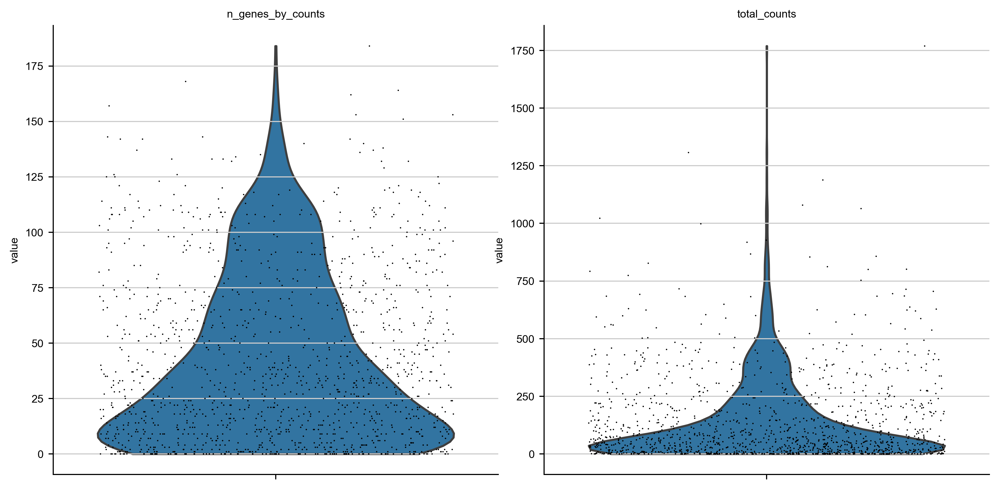

In [18]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

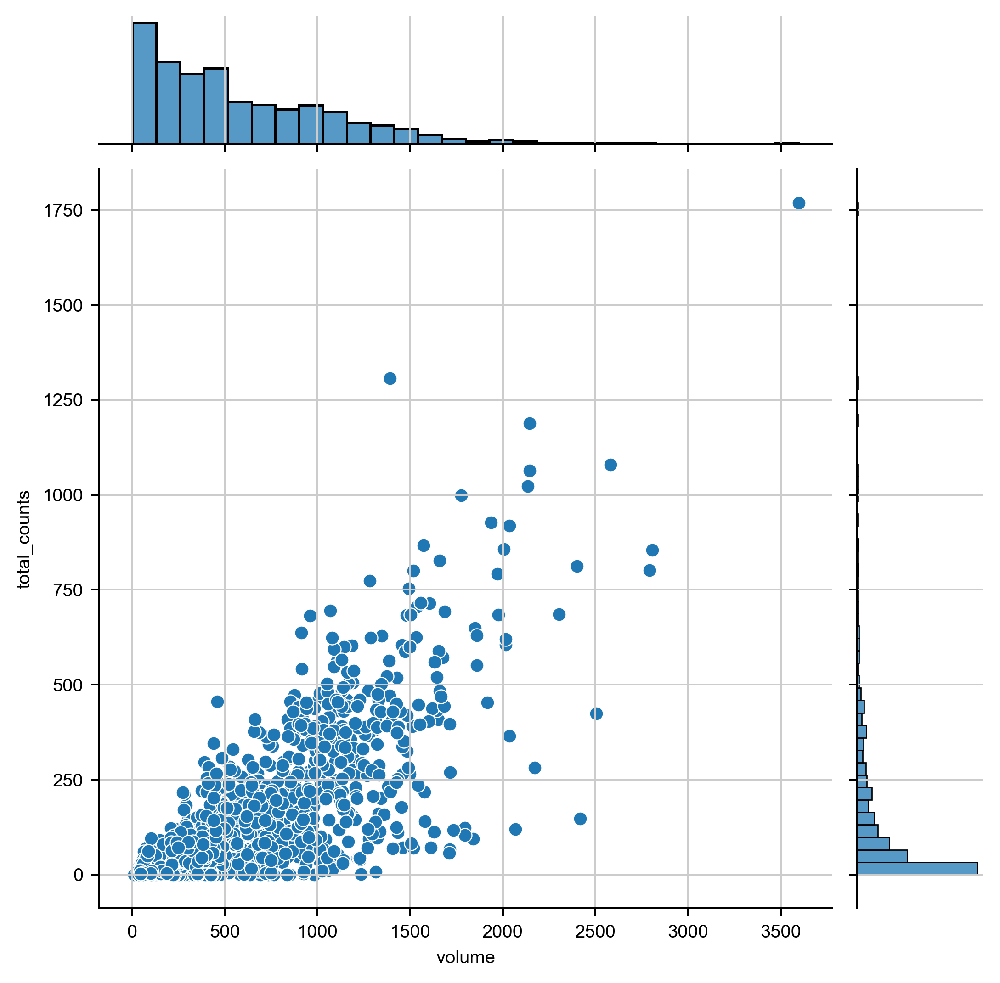

In [19]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

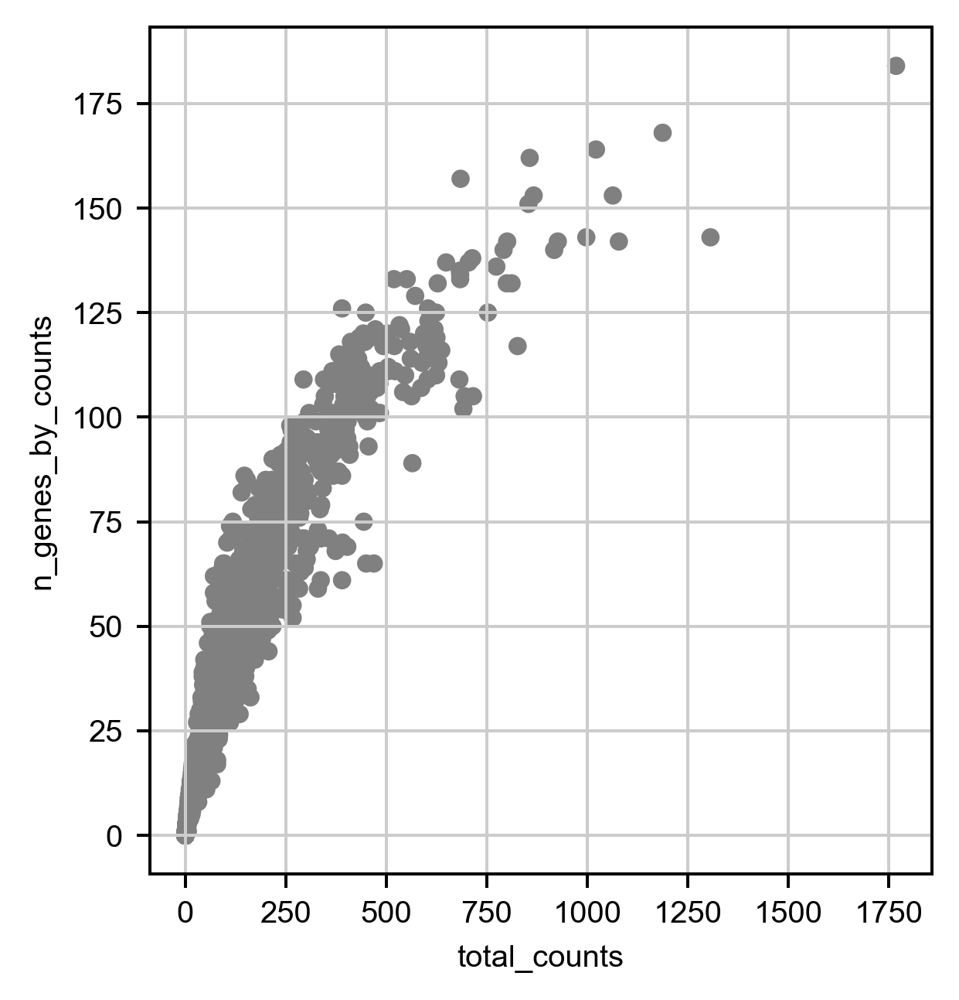

In [20]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [21]:
adata = adata[adata.obs['total_counts'] > 10]
adata = adata[adata.obs['n_genes_by_counts'] > 5]
adata = adata[adata.obs['volume'] > 100]

print(len(adata))

1002


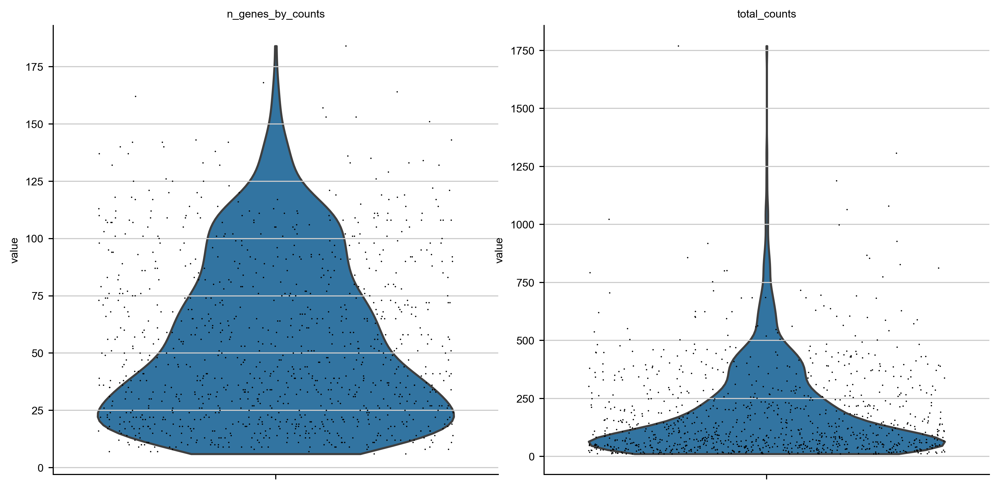

In [22]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [23]:
max(adata.obs['total_counts'])

1769.0

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


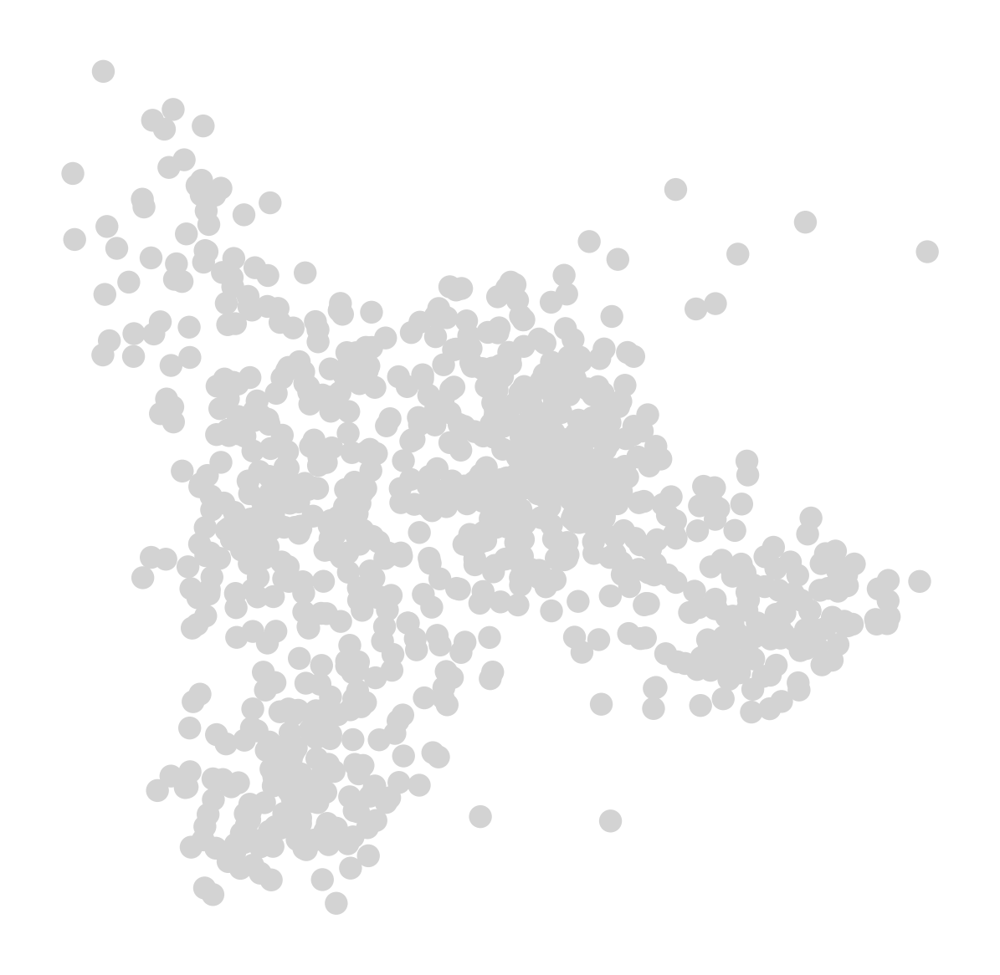

Wall time: 1min 14s


In [24]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [25]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

Wall time: 17.4 s


In [26]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=1)

Wall time: 180 ms


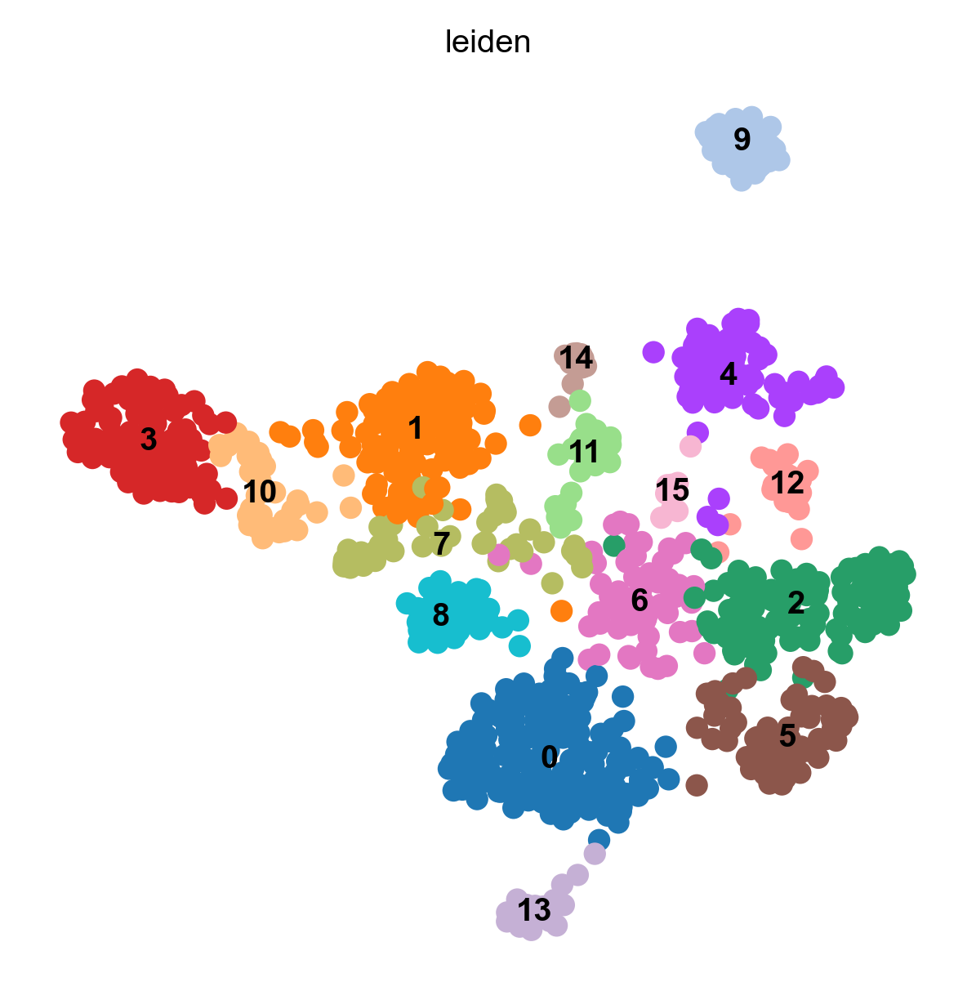

Wall time: 3.64 s


In [27]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

(-6701.66502778763, -6251.43656181572, -5323.343902043998, -3789.50389649719)

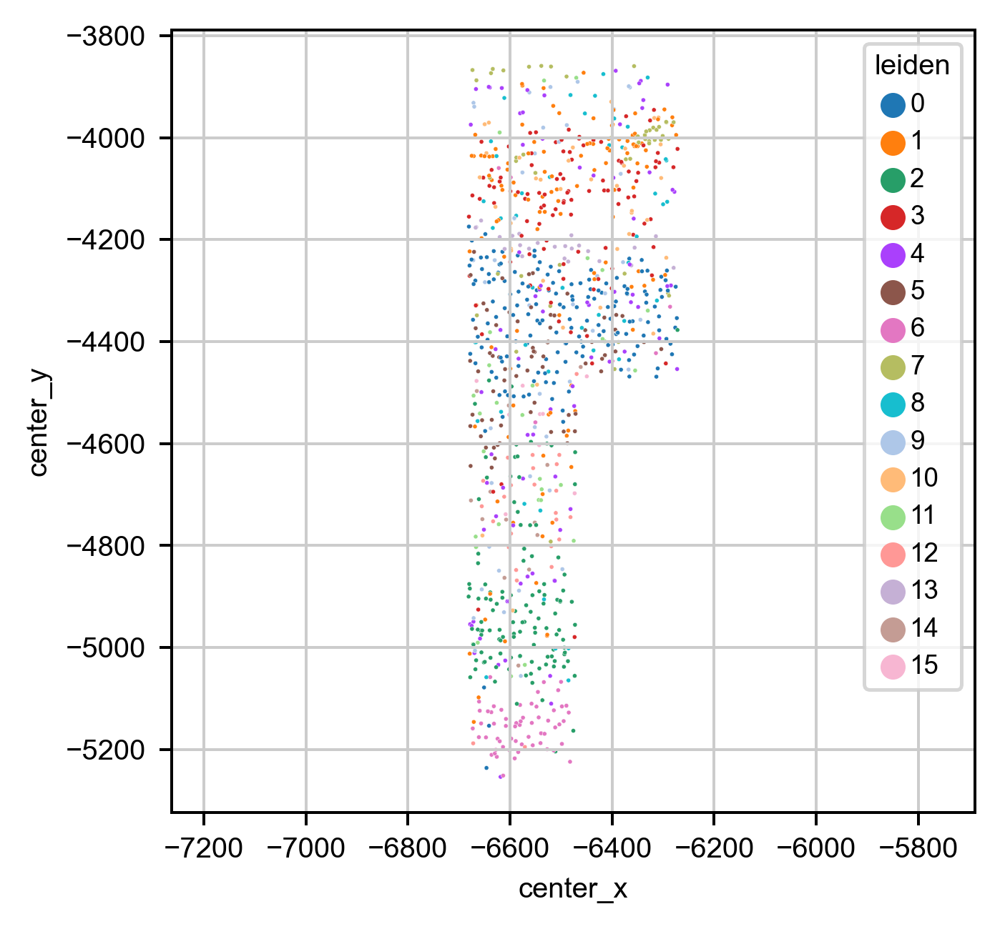

In [28]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
sns.scatterplot(data=adata.obs, x='center_x', y='center_y', hue='leiden', s=1.5)
plt.axis('equal')

(-5302.840344980452, 5582.22175064506, -3383.1310002109035, 2572.5968589497734)

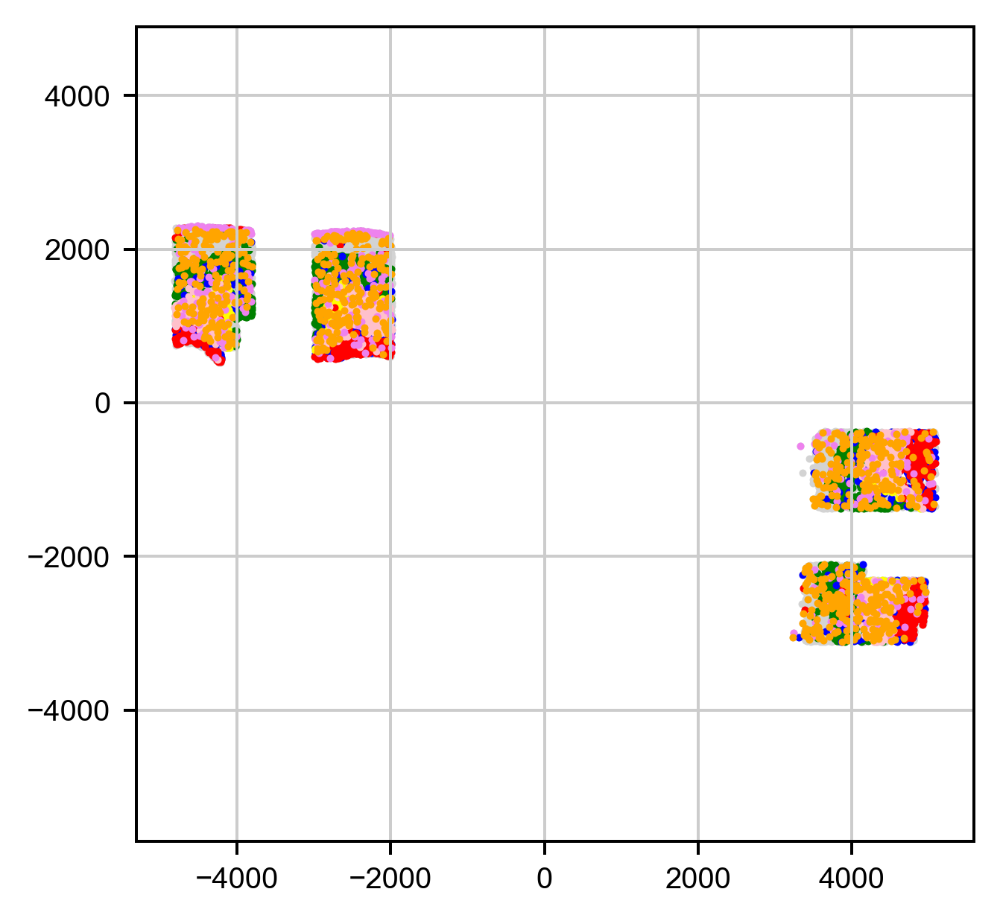

In [40]:
# can also plot a subset of clusters using their "leiden #"
import matplotlib.pyplot as plt

plt.scatter(adata.obs['center_x'], adata.obs['center_y'], c='lightgrey', s=1)


df = adata.obs[adata.obs['leiden'] == '0']
plt.scatter(df['center_x'], df['center_y'], c='green', s=1) 

df = adata.obs[adata.obs['leiden'] == '3']
plt.scatter(df['center_x'], df['center_y'], c='blue', s=1) 

#df = adata.obs[adata.obs['leiden'] == '15']
#plt.scatter(df['center_x'], df['center_y'], c='green', s=1) 


df = adata.obs[adata.obs['leiden'] == '8']
plt.scatter(df['center_x'], df['center_y'], c='yellow', s=1) 


df = adata.obs[adata.obs['leiden'] == '9'] 
plt.scatter(df['center_x'], df['center_y'], c='red', s=1)   


df = adata.obs[adata.obs['leiden'] == '2']
plt.scatter(df['center_x'], df['center_y'], c='pink', s=1) 


df = adata.obs[adata.obs['leiden'] == '13']
plt.scatter(df['center_x'], df['center_y'], c='violet', s=1) 


df = adata.obs[adata.obs['leiden'] == '7']
plt.scatter(df['center_x'], df['center_y'], c='orange', s=1) 


plt.axis('equal')

## 5. Check count for each cell for genes of interest

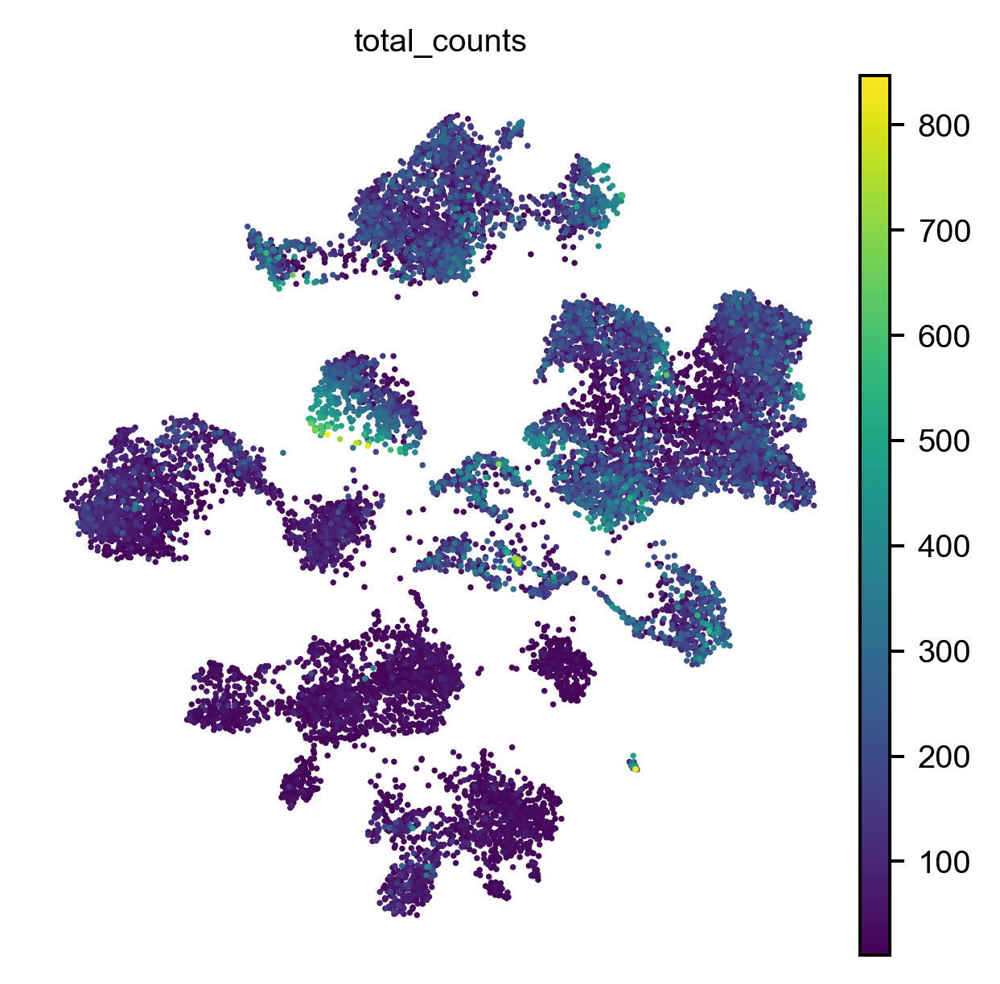

In [41]:
sc.pl.umap(adata, color='total_counts')

In [42]:
# load gene names
sel_gene_df = pd.read_excel(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-12_mop_markers\smFISH_cell_class\MOP_marker_gene_readout.xlsx',
                          )
marker_genes = [_g for _g in sel_gene_df['Target gene'].values if (_g in adata.var.index)]
print(marker_genes)

['Slc30a3', 'Slc32a1', 'Otof', 'Rspo1', 'Sncg', 'Fam84b', 'Tshz2', 'Syt6', 'Nxph4', 'Cux2', 'Rorb', 'Sulf2', 'Ptpru', 'Car3', 'Aqp4', 'Flt1', 'Igf2', 'Pdgfra', 'Sox10', 'Ctss', 'Vtn', 'Bgn']


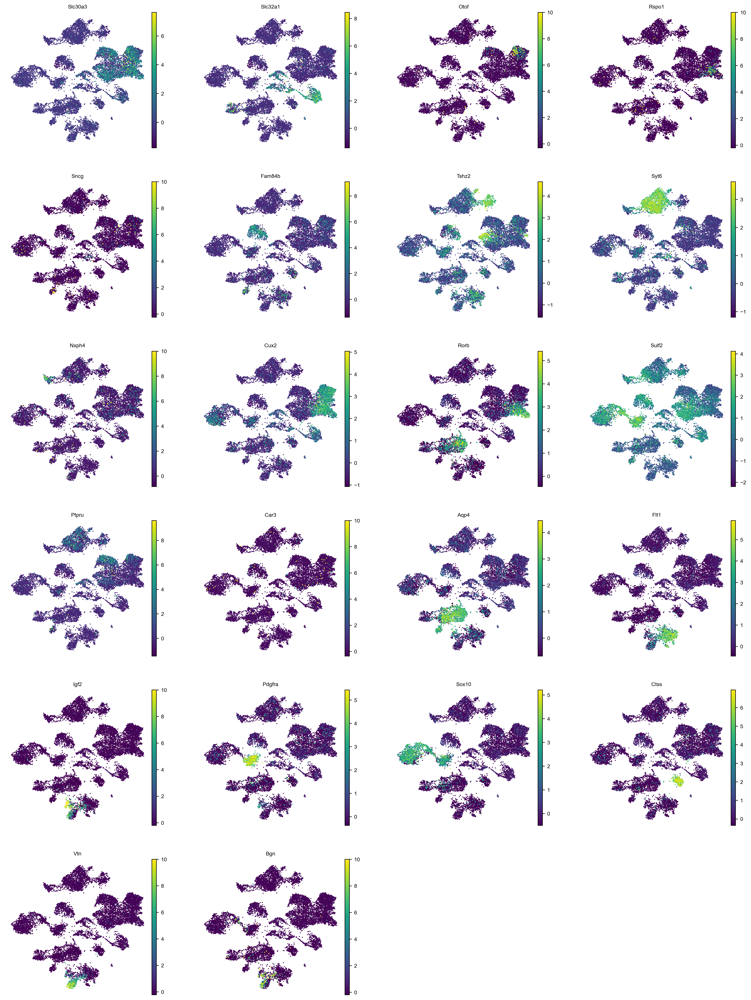

In [43]:
sc.pl.umap(adata, color=marker_genes)

## 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

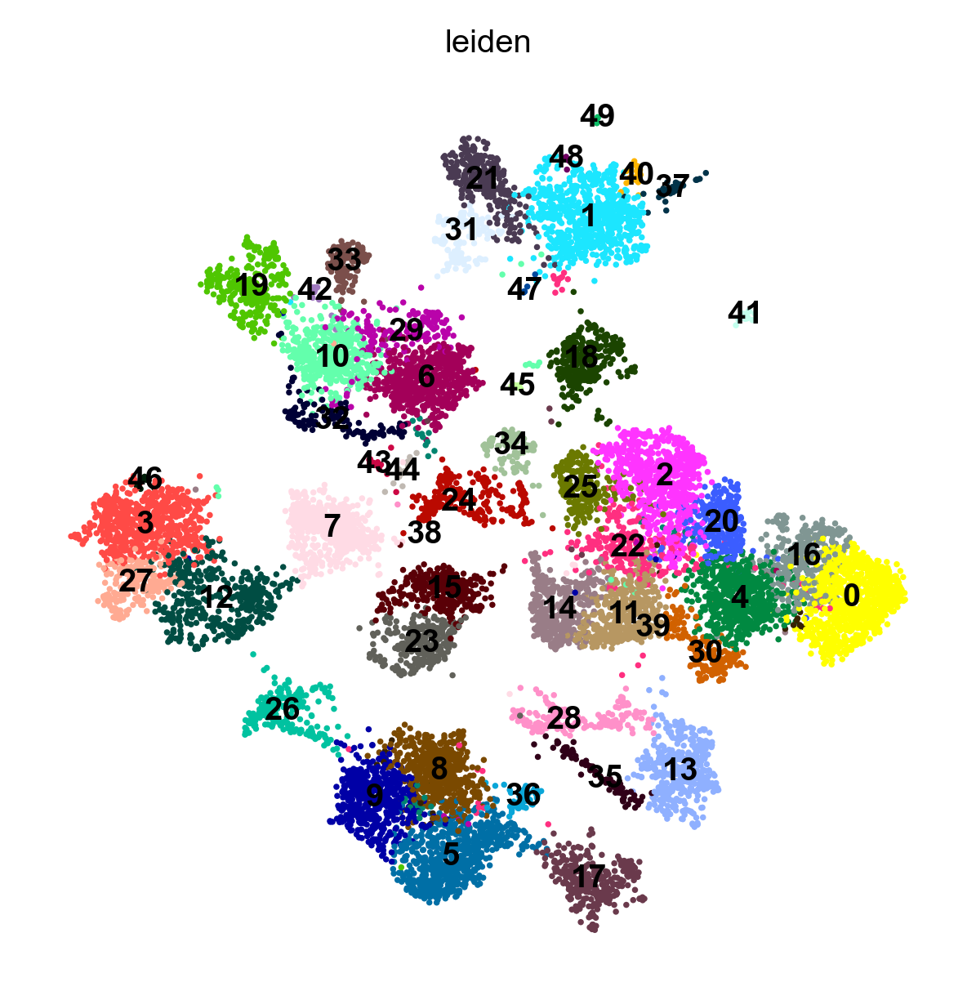

Wall time: 12.2 s


In [45]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=50)

sc.tl.leiden(adata, resolution=2)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this labels as a new column as 'leiden_cluster'
adata.obs['leiden_cluster'] = adata.obs.leiden

## 6.2 Use lower expected pcs and resolution to UMAP for cell-type distinction at subclass level

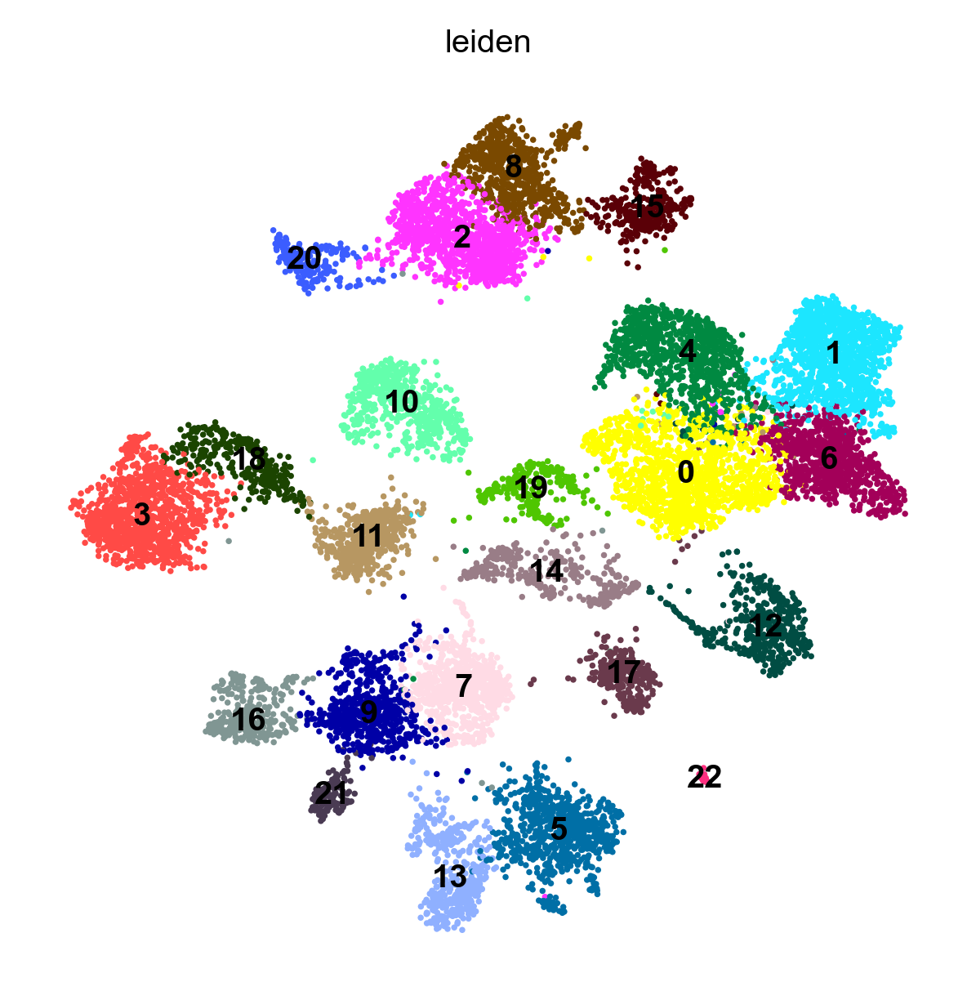

Wall time: 17.1 s


In [46]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

sc.tl.leiden(adata, resolution=1)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this new labels as a new column as 'leiden_subclass'
adata.obs['leiden_subclass'] = adata.obs.leiden

## 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [49]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = False

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: I:\MERFISH_Analysis\Cellpose\20220225-P_brain_M1_nonclear_PostAnalysis\filtered_cluster_data.h5ad
